In [2]:
# importing libraries
import numpy as np
from scipy import signal
from numpy import sin,cos,pi,exp,sqrt
import matplotlib.pyplot as plt

# 1a

In [3]:
# Function for x[n].
def x_n(lower,upper,n):
    output = []
    for i in n:
        if (i>=lower) and (i<=upper):
            output.append(1)
        else:
            output.append(0)
    return output


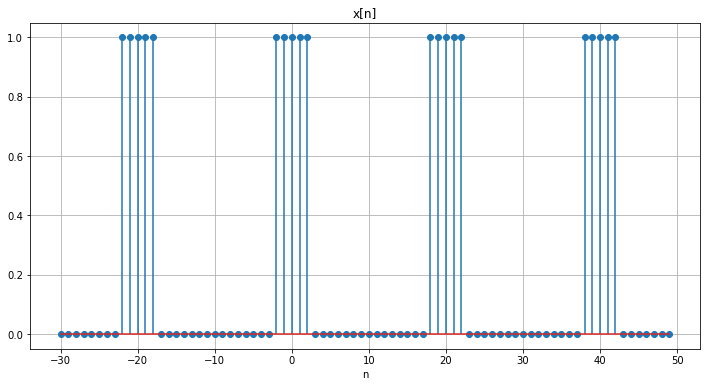

In [4]:
plt.subplots(figsize=(12,6))
lower = -2
upper = 2
N = 20
t = 4
n1 = np.arange(-10,10,1)
out = []
for i in range(t):
    out.append(x_n(lower,upper,n1))
output = out[0]+out[1]+out[2]+out[3]
n2 = np.arange(-30,50,1)
plt.stem(n2,output)
plt.xlabel('n')
plt.title('x[n]')
plt.grid()

#1b

In [5]:
# Function for DTFS coefficients.
def DTFS(x):
    N = len(x)
    output = []
    for k in range(N):
        ck = 0
        for n in range(N):
            ck+=((x[n]*np.exp(-2j*np.pi*k*n/N))/N)
        output.append(ck)
    return output

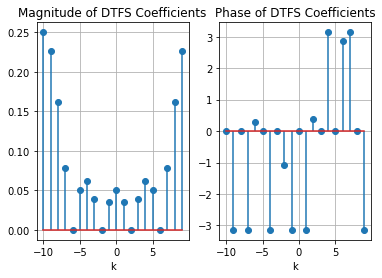

In [6]:
fig,axes = plt.subplots(1,2)

lower = -2
upper = 2
n3 = np.arange(-10,10,1)
x = x_n(lower,upper,n3)
c_k = DTFS(x)

# Magnitude
axes[0].stem(n3,np.absolute(c_k))
axes[0].set_xlabel('k')
axes[0].set_title('Magnitude of DTFS Coefficients')
axes[0].grid()

#Phase 
axes[1].stem(n3,np.angle(c_k))
axes[1].set_xlabel('k')
axes[1].set_title('Phase of DTFS Coefficients')
axes[1].grid()

# 2a

In [7]:
# Function of reconstruction of x[n].
def xn(c,M):
    N = len(c)
    output = []
    for n in range(N):
        x = 0
        for k in range((2*M)+1):
            x+=(c[k]*np.exp(2j*np.pi*k*n/N))
        output.append(x)
    return output

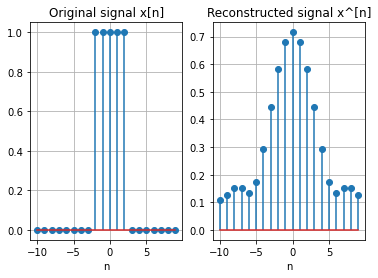

In [8]:
"""original signal x[n]

reconstructed signal x^[n]"""

fig,axes = plt.subplots(1,2)

n4 = np.arange(-10,10,1)


lower = -2
upper = 2
x = x_n(lower,upper,n4)

axes[0].stem(n4,x)
axes[0].set_xlabel('n')
axes[0].set_title('Original signal x[n]')
axes[0].grid()


M = 2
C_k = DTFS(x)
X_n = xn(C_k,M)

axes[1].stem(n4,np.absolute(X_n))
axes[1].set_xlabel('n')
axes[1].set_title('Reconstructed signal x^[n]')
axes[1].grid()

# 2b

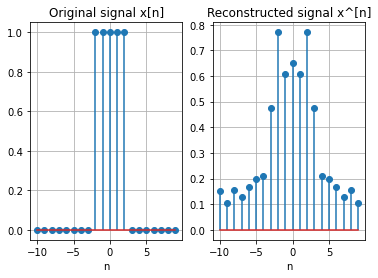

In [9]:

fig,axes = plt.subplots(1,2)

n5 = np.arange(-10,10,1)


lower = -2
upper = 2
x = x_n(lower,upper,n5)

axes[0].stem(n5,x)
axes[0].set_xlabel('n')
axes[0].set_title('Original signal x[n]')
axes[0].grid()


M = 5
C_k = DTFS(x)
X_n = xn(C_k,M)

axes[1].stem(n5,np.absolute(X_n))
axes[1].set_xlabel('n')
axes[1].set_title('Reconstructed signal x^[n]')
axes[1].grid()

## Observation - By increasing the values of of M samples then we start approaching to the original signal.

# 3a

In [10]:
# x[n]
def X(n,N):
    x_n = []
    for i in n:
        x_n.append(1 + np.sin(2*np.pi*i/N) + 3*np.cos(2*np.pi*i/N))
    return x_n

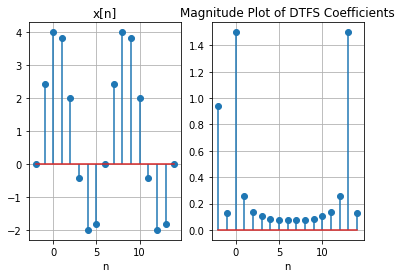

In [11]:
fig,axes = plt.subplots(1,2)

n6 = np.arange(-2,15,1)

# x[n]

N = 8
output = X(n6,N)

axes[0].stem(n6,output)
axes[0].set_xlabel('n')
axes[0].set_title('x[n]')
axes[0].grid()

# reconstructed signal x_[n].

dtfs_x = DTFS(output)

axes[1].stem(n6,np.absolute(dtfs_x))
axes[1].set_xlabel('n')
axes[1].set_title('Magnitude Plot of DTFS Coefficients')
axes[1].grid()

# 3b

In [12]:
N = len(output)
square_sum_x_n = sum(np.square(output))/N
square_sum_c_k = sum(np.square(np.absolute(dtfs_x)))
print('x_n = ',square_sum_x_n)
print('c_n = ',square_sum_c_k)


x_n =  5.647058823529411
c_n =  5.647058823529405


# 4a

In [13]:
# fourier transform.
def DTFT(x,omega):
    n = len(x)
    dt_ft = 0
    for i in range(n):
        dt_ft+=x[i]*(np.exp(-1j*omega*i))
    return dt_ft

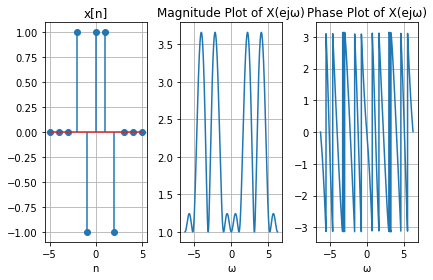

In [14]:
fig,axes = plt.subplots(1,3)

# x[n]

n7 = np.arange(-5,6,1)
X_n = [0,0,0,1,-1,1,1,-1,0,0,0]

axes[0].stem(n7,X_n)
axes[0].set_xlabel('n')
axes[0].set_title('x[n]')
axes[0].grid()

# fourier transform --> x[n].

omega = np.arange(-2*np.pi,2*np.pi,0.01)
X_omega = DTFT(X_n,omega)

# Magnitude fourier transform of x[n].

axes[1].plot(omega,np.absolute(X_omega))
axes[1].set_xlabel('ω')
axes[1].set_title('Magnitude Plot of X(ejω)')

axes[1].grid()

# Phase of fourier transform of x[n].

axes[2].plot(omega,np.angle(X_omega))
axes[2].set_xlabel('ω')
axes[2].set_title('Phase Plot of X(ejω)')

axes[2].grid()
plt.tight_layout()

# 5

In [15]:
# function to generate unit step sequence h[n].
def h_n_1(a,n):
    unit_step_seq =[]
    for sample in n:
        if sample < 0:
            unit_step_seq.append(0)
        else:
            unit_step_seq.append(a)
    return unit_step_seq

In [16]:
# function to generate unit step sequence x[n].
def x_n_1(a,n):
    unit_step_seq =[]
    for sample in n:
        if sample < 0:
            unit_step_seq.append(0)
        else:
            unit_step_seq.append(a*sample)
    return unit_step_seq

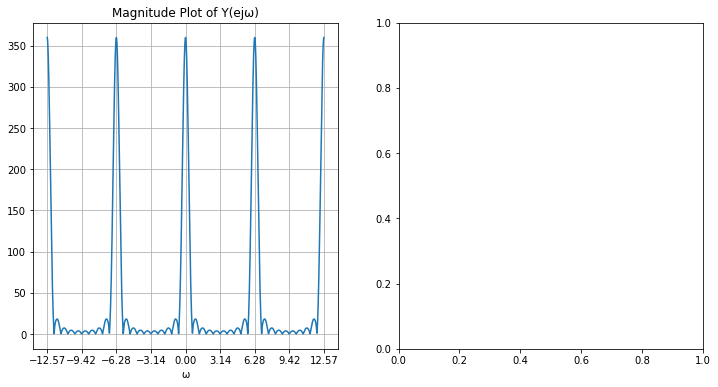

In [17]:
#  DTFT Y(ejω) and inverse DTFT of y[n]
fig,axes = plt.subplots(1,2,figsize=(12,6))

n8 = np.arange(-10,10,1)

# h[n].
a1 = 1
h_n = h_n_1(a1,n8)

# x[n].
a2 = 0.8
x_n = x_n_1(a2,n8)

# y[n].
y_n = np.convolve(x_n,h_n)

# DTFT of y[n].

omega = np.arange(-4*np.pi,4*np.pi,0.01)
dtft_y_n = DTFT(y_n,omega)

axes[0].plot(omega,np.absolute(dtft_y_n))
axes[0].set_xlabel('ω')
axes[0].set_title('Magnitude Plot of Y(ejω)')

axes[0].set_xticks([-4*np.pi,-3*np.pi,-2*np.pi,-np.pi,0,np.pi,2*np.pi,3*np.pi,4*np.pi])
axes[0].grid()



n9 = np.arange(-20,19,1)

# 6a

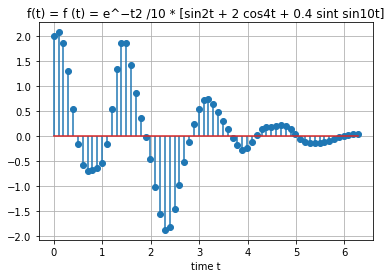

In [18]:
# t = 2 pi i/64. i be ranging 0-63
t=np.linspace(0,2*pi,64)
f=exp(-0.1*(t)**2)*(sin(2*t)+2*cos(4*t)+0.4*sin(t)*sin(10*t))
plt.stem(t,f)
plt.title('f(t) = f (t) = e^−t2 /10 * [sin2t + 2 cos4t + 0.4 sint sin10t]')
plt.xlabel("time t")
plt.grid()
plt.show()

# 6b

<ipython-input-19-ba6c543d3072>:7: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  W=np.zeros((N,N),dtype = np.complex)


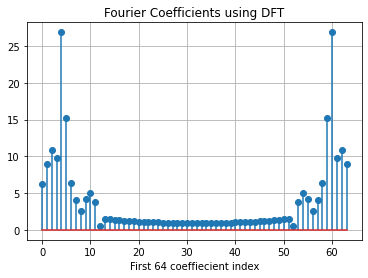

In [19]:
N=64
w=exp(-2j*pi/N)
p=[]
for i in range(N):
    p.append(w**i)
a=np.array(p)
W=np.zeros((N,N),dtype = np.complex)
for i in range(N):
    W[:,i]=a**i
coeff=np.matmul(W,f)  


plt.stem(range(N),np.abs(coeff))
plt.title( 'Fourier Coefficients using DFT' )
plt.xlabel("First 64 coeffiecient index")
plt.grid()
plt.show()


# 7a

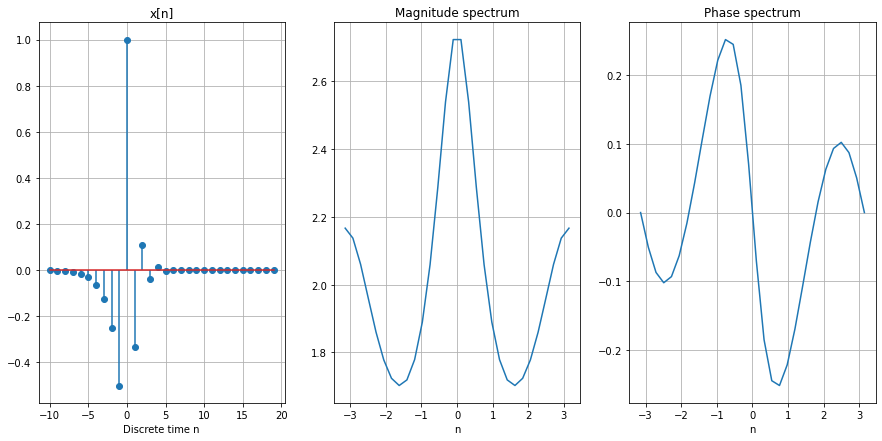

In [20]:
n=np.arange(-10,20,1)
x=np.zeros(len(n))
def unit(a,b,c):
    for i in range(len(n)):
        if(n[i]/b)<c:
            x[i]=0
        elif (n[i]/b)>=c :
            x[i]=(a)**(n[i]*b)
    return np.array(x)  
y1=unit((-1/3),1,0)
y2=unit(0.5,-1,1)
xn=y1-y2
#for magnitude and phase
w=np.linspace(-pi,pi,30)
a=exp(1j*w)
x1=a/(a+(1/3))
x2=a/(a-0.5)
X_z=x1+x2
fig, ax=plt.subplots(1,3,figsize=(15,7))        
ax[0].stem(n,xn)
ax[0].set_title('x[n]')
ax[0].set_xlabel("Discrete time n")
ax[0].grid()
ax[1].plot(w,np.abs(X_z))
ax[1].set_title('Magnitude spectrum')
ax[1].set_xlabel("n")
ax[1].grid()
ax[2].plot(w,np.angle(X_z))
ax[2].set_title('Phase spectrum')
ax[2].set_xlabel("n")
ax[2].grid()
plt.show()


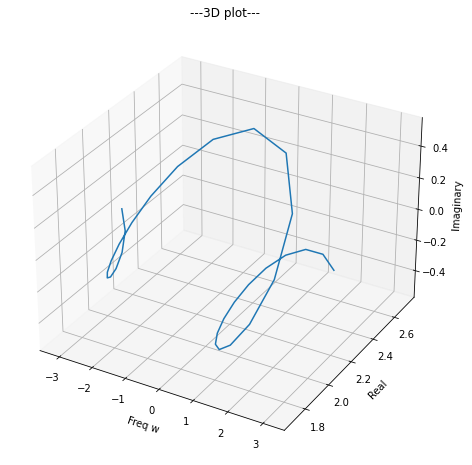

In [21]:
plt.figure(figsize=(8,8))
ax=plt.axes(projection='3d')
ax.plot3D(w, (X_z).real, ((X_z).imag))
ax.set_title('---3D plot---')
ax.set_xlabel("Freq w")
ax.set_ylabel("Real ")
ax.set_zlabel("Imaginary ")
plt.show()

# 7b

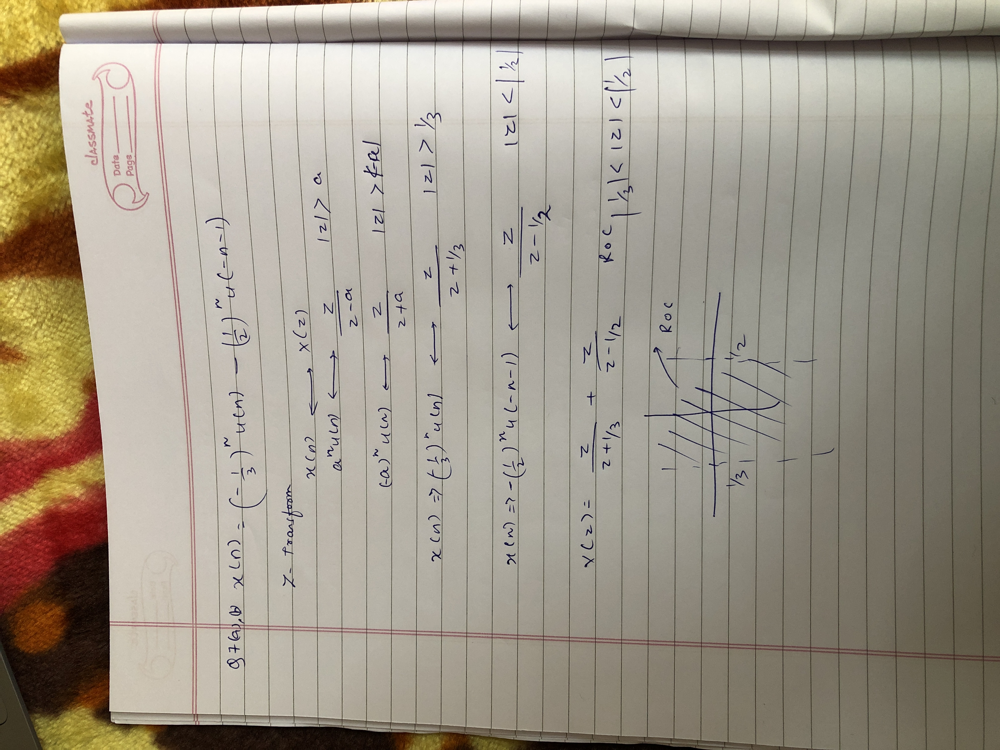

# 8a

Zeros= [0. 0. 0.]
Poles= [ 0.5        -0.33333333 -0.33333333]


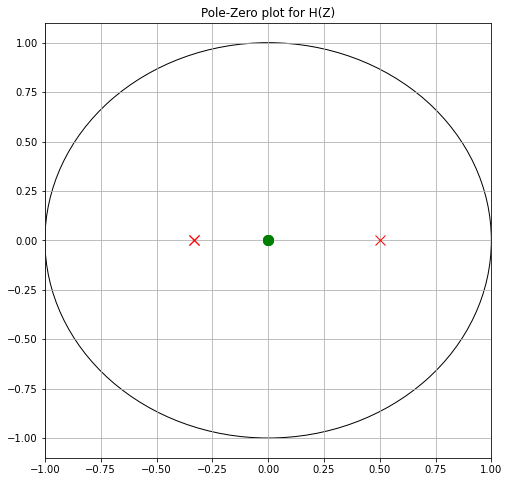

In [23]:
num = [18,0,0,0]
den=[18,3,-4,-1]
Z=np.roots(num)
print("Zeros=",Z)
P=np.roots(den)
print("Poles=",P)
plt.figure(figsize=(8,8))
plt.xlim([-1,1])
t1 = plt.plot(Z.real, Z.imag, 'go', ms=10)

# Plot the poles and set marker properties
t2 = plt.plot(P.real, P.imag, 'rx', ms=10)

circle1 = plt.Circle((0, 0), 1,fill=False)
plt.gca().add_patch(circle1)
plt.title('Pole-Zero plot for H(Z)')
plt.grid()
plt.show()

# 8b

In [24]:
from sympy import *
z = symbols('z')
def inverse_z(h):
    h = h/z
    h = h.apart() * z
    return expand(h)
n = 18*(z**3)
d = 18*(z**3)+3*(z**2)-(4*z)-1
a = n/d
a = inverse_z(a)
a

-6*z/(45*z**2 + 30*z + 5) + 48*z/(75*z + 25) + 18*z/(50*z - 25)

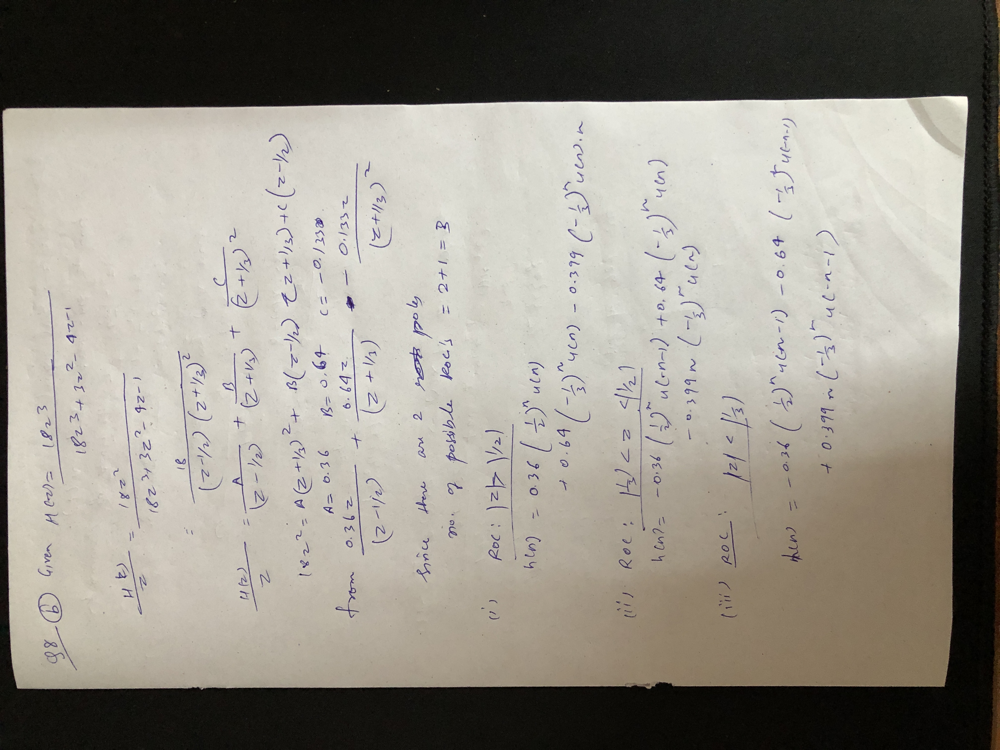

# 9

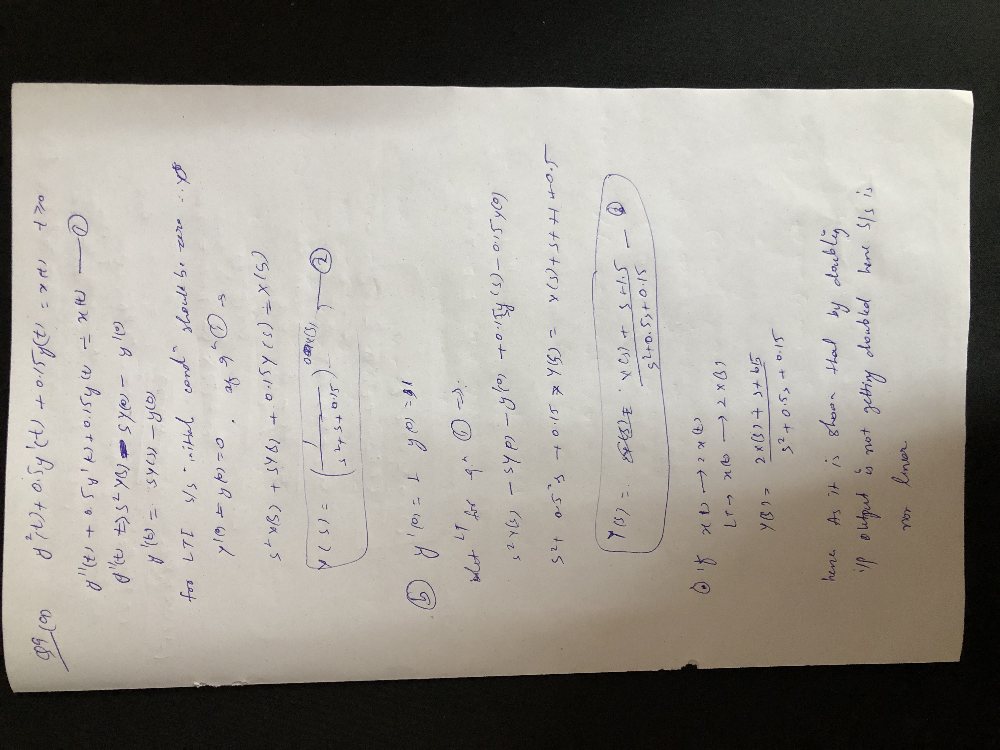

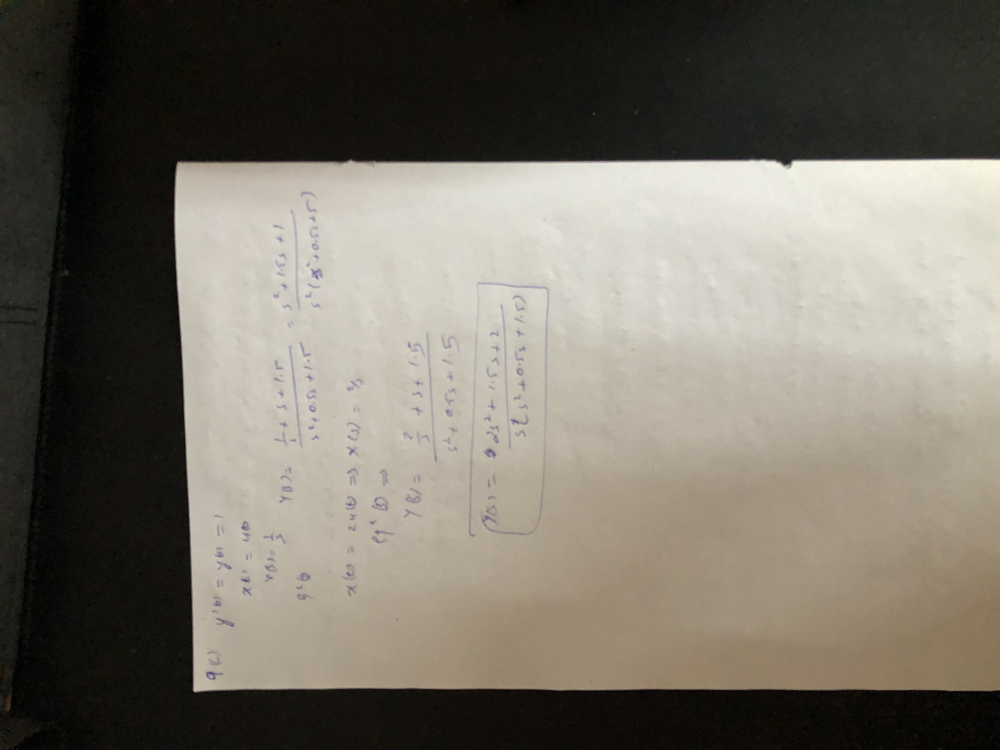

# 10

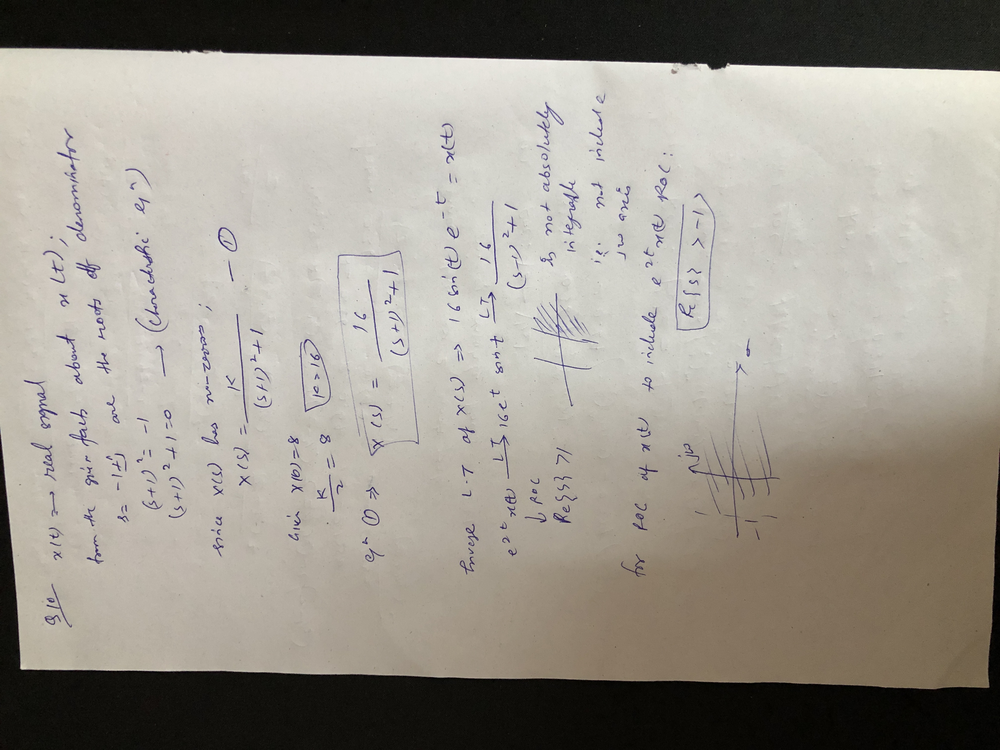